## Transfer Learning using InceptionV3 and Keras

In [111]:
# import the libraries as shown below

from tensorflow.keras.layers import Input, Lambda, Dense, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping
import numpy as np
from glob import glob
import matplotlib.pyplot as plt
import datetime
import tensorflow as tf
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [112]:
!nvidia-smi

Tue Feb  7 23:15:30 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 510.47.03    Driver Version: 510.47.03    CUDA Version: 11.6     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   68C    P0    29W /  70W |   2870MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [113]:
!rm -rf ./logs/ 

In [114]:
import tensorflow as tf
print(tf.__version__)

2.9.2


In [115]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [116]:
# re-size all the images to this
IMAGE_SIZE = [224, 224]

train_path = '/content/drive/MyDrive/mydataset/train'
valid_path = '/content/drive/MyDrive/mydataset/Validation'
trial_path='/content/drive/MyDrive/mydataset/test'


In [117]:
# Import the Vgg 16 library as shown below and add preprocessing layer to the front of VGG
# Here we will be using imagenet weights

mob = MobileNetV2(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)

In [118]:
# don't train existing weights
for layer in mob.layers:
    layer.trainable = False

In [119]:
  # useful for getting number of output classes
folders = glob('/content/drive/MyDrive/mydataset/train/*')

In [120]:
folders

['/content/drive/MyDrive/mydataset/train/rough_train',
 '/content/drive/MyDrive/mydataset/train/slippery_train']

In [121]:
x = Flatten()(mob.output)

In [122]:
prediction = Dense(len(folders), activation='sigmoid')(x)

# create a model object
model = Model(inputs=mob.input, outputs=prediction)

In [ ]:

# view the structure of the model
model.summary()


In [123]:
# tell the model what cost and optimization method to use
from tensorflow.keras.metrics import *
from tensorflow.keras.optimizers import Adam
model.compile(
 loss='binary_crossentropy',
  optimizer=Adam(learning_rate=0.00001),
  metrics= ['accuracy', Precision(), Recall()]
  
)
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [124]:
# Use the Image Data Generator to import the images from the dataset
from tensorflow.keras.preprocessing.image import ImageDataGenerator;
from tensorflow.image import flip_left_right, adjust_brightness, adjust_contrast
train_datagen = ImageDataGenerator(rescale = 1./255,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,  
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True
)

test_datagen = ImageDataGenerator(rescale = 1./255,  
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True
)

In [125]:
# Make sure you provide the same target size as initialied for the image size
training_set = train_datagen.flow_from_directory('/content/drive/MyDrive/mydataset/train',
                                                 target_size = (224, 224),
                                                 batch_size = 32,
                                                 class_mode = 'categorical')

Found 1281 images belonging to 2 classes.


In [126]:
training_set

In [127]:
test_set = test_datagen.flow_from_directory('/content/drive/MyDrive/mydataset/Validation',
                                            target_size = (224, 224),
                                            batch_size = 32,
                                            class_mode = 'categorical')

Found 328 images belonging to 2 classes.


In [128]:
test_ds = tf.keras.utils.image_dataset_from_directory(
    "/content/drive/MyDrive/mydataset/test",
    image_size = (224, 224),
    batch_size = 32 )

Found 31 files belonging to 2 classes.


In [129]:
class_names = ["rough", "slippery"]

In [130]:
monitor = EarlyStopping(monitor='val_loss', min_delta=1e-3, patience=5, 
        verbose=1, mode='auto', restore_best_weights=True)

In [131]:
# fit the model
# Run the cell. It will take some time to execute

r = model.fit_generator(
  training_set,
  validation_data=test_set,
  epochs=50,
  steps_per_epoch=len(training_set),
  validation_steps=len(test_set),
  callbacks=[tensorboard_callback, monitor]
)

<ipython-input-131-77b497bd5165>:4: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  r = model.fit_generator(


Epoch 1/50
41/41 [==============================] - 34s 757ms/step - loss: 0.8184 - accuracy: 0.5652 - precision_1: 0.5498 - recall_1: 0.5644 - val_loss: 0.6523 - val_accuracy: 0.6738 - val_precision_1: 0.6696 - val_recall_1: 0.6860
Epoch 2/50
41/41 [==============================] - 30s 727ms/step - loss: 0.5512 - accuracy: 0.7814 - precision_1: 0.7346 - recall_1: 0.7455 - val_loss: 0.5800 - val_accuracy: 0.7378 - val_precision_1: 0.6802 - val_recall_1: 0.7134
Epoch 3/50
41/41 [==============================] - 29s 724ms/step - loss: 0.4865 - accuracy: 0.8033 - precision_1: 0.7772 - recall_1: 0.7814 - val_loss: 0.5622 - val_accuracy: 0.7409 - val_precision_1: 0.7064 - val_recall_1: 0.7409
Epoch 4/50
41/41 [==============================] - 29s 714ms/step - loss: 0.4357 - accuracy: 0.8407 - precision_1: 0.8031 - recall_1: 0.8119 - val_loss: 0.5489 - val_accuracy: 0.7256 - val_precision_1: 0.7254 - val_recall_1: 0.7409
Epoch 5/50
41/41 [==============================] - 30s 726ms/step -

In [132]:
%tensorboard --logdir logs/fit

Reusing TensorBoard on port 6006 (pid 17549), started 0:22:49 ago. (Use '!kill 17549' to kill it.)

<IPython.core.display.Javascript object>

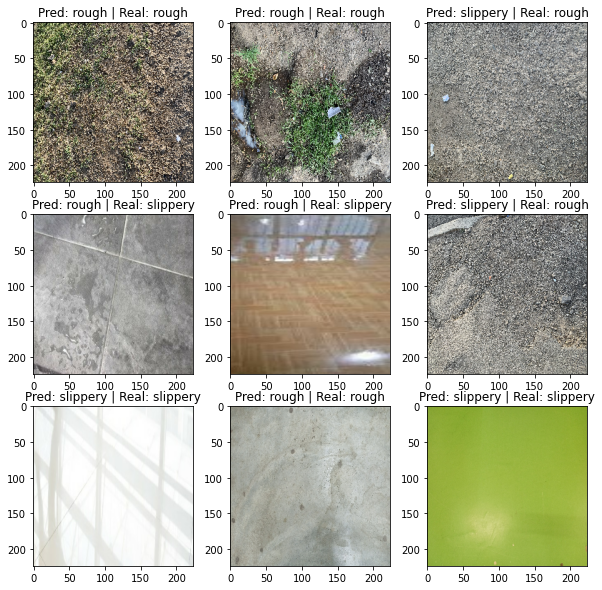

In [134]:
import numpy

plt.figure(figsize=(10,10))
for images, labels in test_ds.take(1):
  classifications = model(images)
  # print(classifications)
  
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    index = numpy.argmax(classifications[i])
    plt.title("Pred: " + class_names[index] + " | Real: " + class_names[labels[i]])

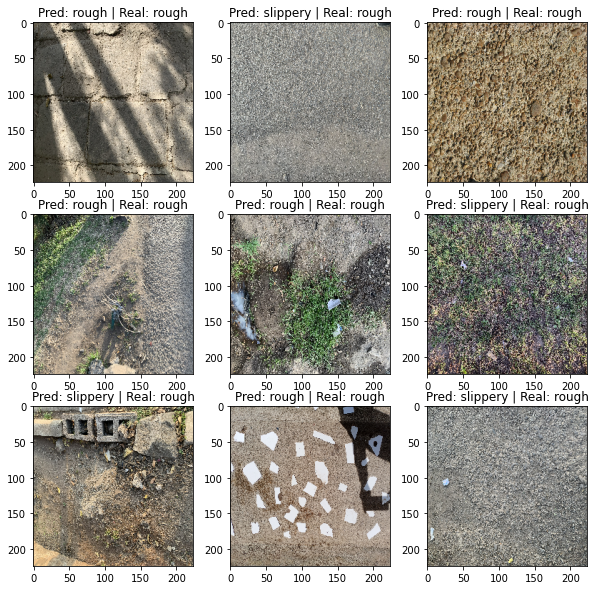

In [135]:
import numpy

plt.figure(figsize=(10,10))
for images, labels in test_ds.take(1):
  classifications = model(images)
  # print(classifications)
  
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    index = numpy.argmax(classifications[i])
    plt.title("Pred: " + class_names[index] + " | Real: " + class_names[labels[i]])

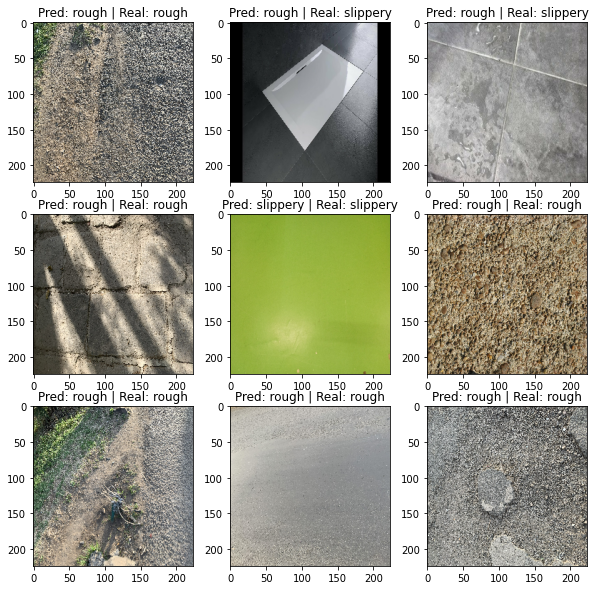

In [136]:
import numpy

plt.figure(figsize=(10,10))
for images, labels in test_ds.take(1):
  classifications = model(images)
  # print(classifications)
  
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    index = numpy.argmax(classifications[i])
    plt.title("Pred: " + class_names[index] + " | Real: " + class_names[labels[i]])

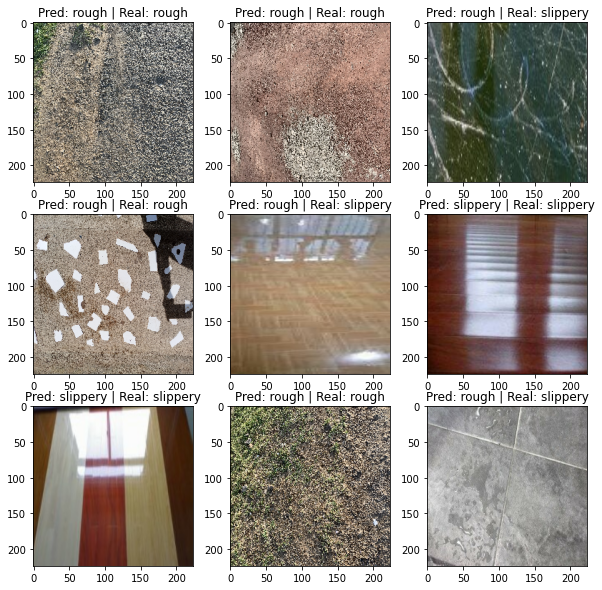

In [137]:
import numpy

plt.figure(figsize=(10,10))
for images, labels in test_ds.take(1):
  classifications = model(images)
  # print(classifications)
  
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    index = numpy.argmax(classifications[i])
    plt.title("Pred: " + class_names[index] + " | Real: " + class_names[labels[i]])
    